# **Project Title : Plant Disease Classification**

# **Done by :**
**Durga Venkata Phanindra Kumar Mulamreddy**

**Sai Ruthvik Anantapalli**

**Ranadeep Reddy Gurram**

#Link to dataset:
 https://www.kaggle.com/datasets/arjuntejaswi/plant-village

# **Exploratory Data Analysis of the dataset**

In [1]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Importing all the required libraries**

In [2]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras import models, layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

## **Dataset loading and preprocessing**

In [3]:
# Parameters
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS = 3

# Dataset path in Google Drive
dataset_path = '/content/drive/MyDrive/PlantVillage'

# Verify dataset path exists
if not os.path.exists(dataset_path):
    print("Dataset directory does not exist!")
    exit()

# Loading data into the TensorFlow dataset
tfdataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [4]:
# The dataset is classified into three classes
class_names = tfdataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [5]:
num_samples = len(tfdataset) * BATCH_SIZE
print("Total number of samples:", num_samples)

Total number of samples: 2176


## The length of the dataset is 68 and each containing the batch size of 32 elements in it and the total samples are 2176 images in the dataset


In [6]:
# Iterate over the first batch of images and labels in the dataset and printing the shape of the image batch and the numpy array representation of the labels batch
for image_batch, labels_batch in tfdataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[1 1 1 0 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 2 0 0]


In [7]:
# Iterate over the first batch of images and labels in the dataset and printing the numpy array of the first image in the batch
for image_batch, labels_batch in tfdataset.take(1):
    print(image_batch[0].numpy())

[[[163. 161. 172.]
  [129. 127. 138.]
  [108. 106. 117.]
  ...
  [163. 161. 175.]
  [158. 156. 170.]
  [153. 151. 165.]]

 [[149. 147. 158.]
  [ 98.  96. 107.]
  [144. 142. 153.]
  ...
  [159. 157. 171.]
  [165. 163. 177.]
  [168. 166. 180.]]

 [[100.  98. 109.]
  [117. 115. 126.]
  [188. 186. 199.]
  ...
  [163. 161. 175.]
  [164. 162. 176.]
  [164. 162. 176.]]

 ...

 [[142. 138. 153.]
  [120. 116. 131.]
  [136. 132. 147.]
  ...
  [180. 178. 191.]
  [178. 176. 189.]
  [189. 187. 200.]]

 [[118. 114. 129.]
  [102.  98. 113.]
  [157. 153. 168.]
  ...
  [177. 175. 188.]
  [172. 170. 183.]
  [177. 175. 188.]]

 [[123. 119. 134.]
  [128. 124. 139.]
  [148. 144. 159.]
  ...
  [205. 203. 216.]
  [188. 186. 199.]
  [173. 171. 184.]]]


## **Plotting distribution of classes in a Pie Chart**

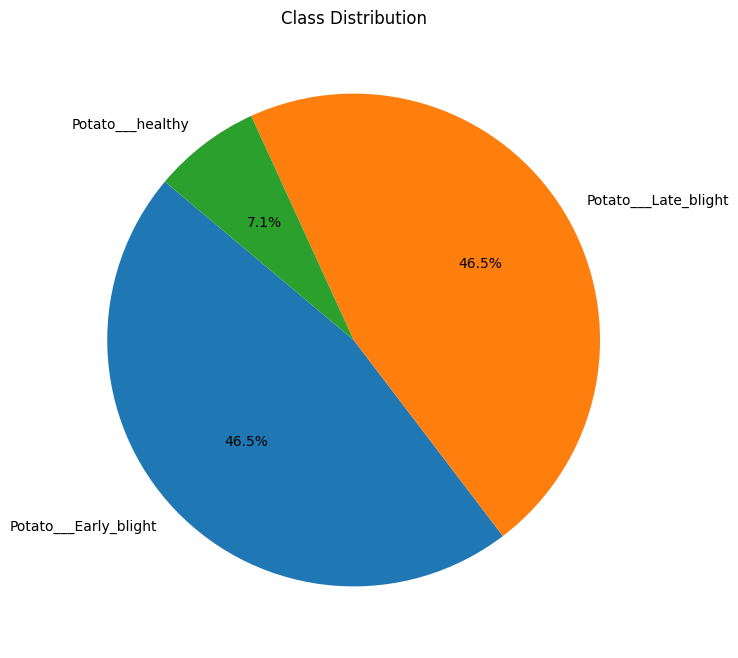

In [8]:
import matplotlib.pyplot as plt

# Initialize an empty dictionary for class counts
class_counts = {class_name: 0 for class_name in class_names}

# Iterate over the dataset and count the occurrences of each class
for _, labels_batch in tfdataset:
    for label in labels_batch.numpy():
        class_counts[class_names[label]] += 1

# Prepare data for the pie chart
labels = list(class_counts.keys())
sizes = list(class_counts.values())

# Plot the class distribution as a pie chart
plt.figure(figsize=(8, 8))  # Adjust the figure size as needed
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Class Distribution')
plt.show()


## **Computing Image Statistics**

In [9]:
# Initialize empty lists to store mean and standard deviation values
list_mean = []
list_std = []

# Iterate over the dataset batches
for image_batch, _ in tfdataset:
    mean = tf.math.reduce_mean(image_batch, axis=(0, 1, 2))
    std = tf.math.reduce_std(image_batch, axis=(0, 1, 2))
    list_mean.append(mean)
    list_std.append(std)
list_mean = tf.reduce_mean(list_mean, axis=0)
list_std = tf.reduce_mean(list_std, axis=0)
print("Mean values of RGB:", list_mean.numpy())
print("Standard Deviation values of RGB:", list_std.numpy())

Mean values of RGB: [126.047264 130.49966  108.87487 ]
Standard Deviation values of RGB: [48.86756  45.348892 54.71175 ]


## **Visualization of Sample Dataset**

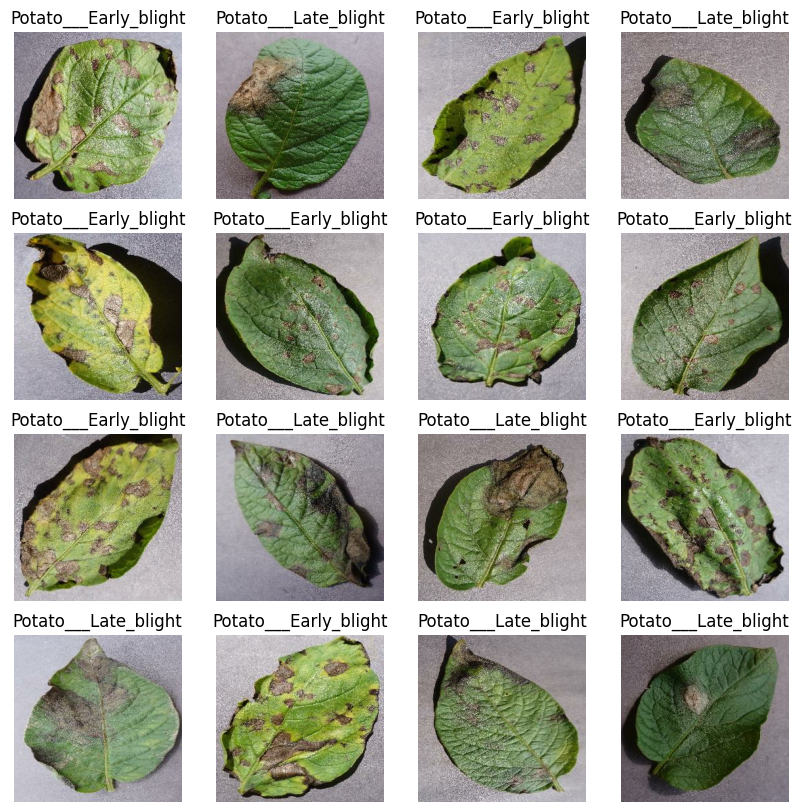

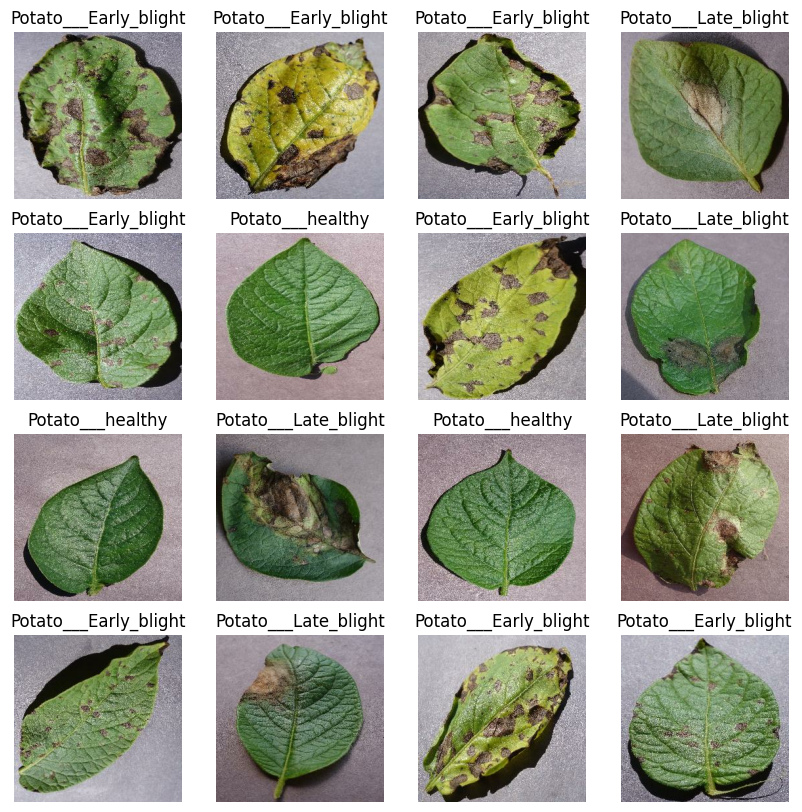

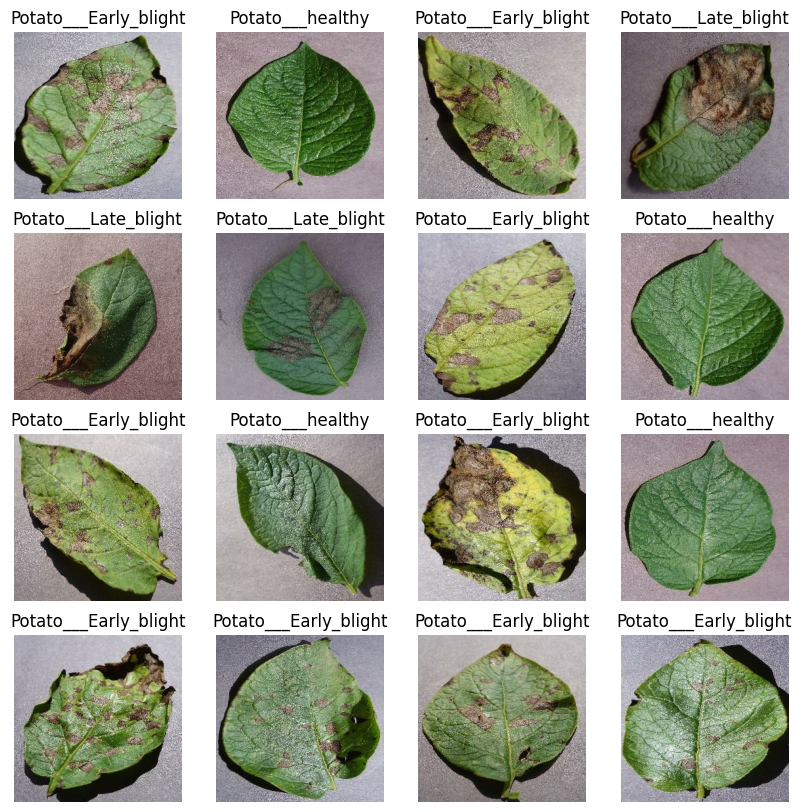

In [10]:
import matplotlib.pyplot as plt

# Function to display a batch of images
def display_image_batch(image_batch, label_batch, class_names):
    plt.figure(figsize=(10, 10))
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(class_names[label_batch[i]])
        plt.axis('off')

# Visualize samples from the first 3 batches in the dataset
for images, labels in tfdataset.take(3):
    display_image_batch(images, labels, class_names)
plt.show()


## **Visualizing data augumentation**

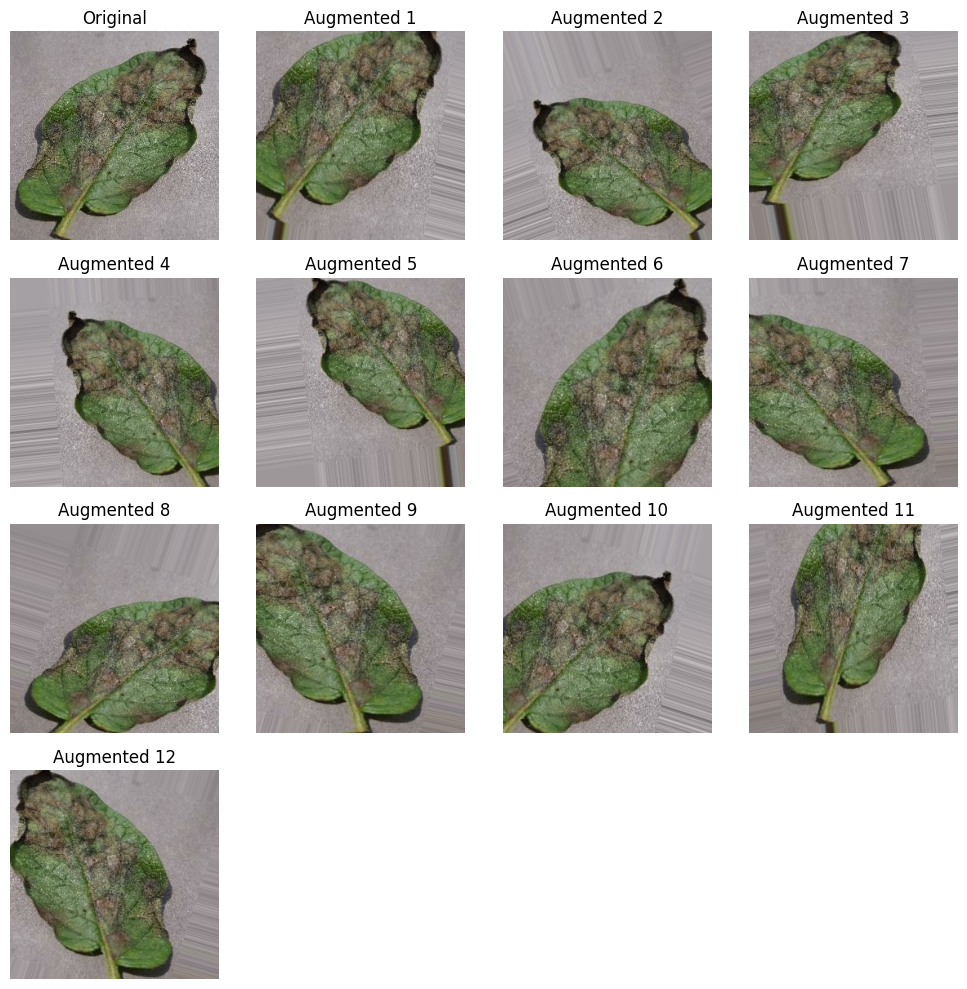

In [11]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augment_image(image, data_gen, num_augmented=12):
    """Generate a specified number of augmented images."""
    augmented_images = []
    for _ in range(num_augmented):
        augmented_images.append(data_gen.random_transform(image))
    return augmented_images

def plot_images(original_image, augmented_images):
    """Plot the original and a list of augmented images."""
    num_images = len(augmented_images) + 1
    plt.figure(figsize=(10, 10))
    plt.subplot(4, 4, 1)
    plt.imshow(original_image.astype("uint8"))
    plt.title("Original")
    plt.axis("off")

    for i, image in enumerate(augmented_images):
        plt.subplot(4, 4, i + 2)  # Start from the second plot
        plt.imshow(image.astype("uint8"))
        plt.title(f"Augmented {i+1}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Convert the sample image to a NumPy array
sample_image = next(iter(tfdataset))[0][0].numpy()

# Create an instance of the ImageDataGenerator with desired augmentation options
data_generator = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generate augmented images and plot them
augmented_images = augment_image(sample_image, data_generator)
plot_images(sample_image, augmented_images)


## **Describing image statistics**

In [12]:
# Variables to accumulate mean and standard deviation values
list_mean = tf.zeros((3,), dtype=tf.float32)
variance_values = tf.zeros((3,), dtype=tf.float32)
count = tf.constant(0, dtype=tf.float32)

# Iterate over the dataset and calculate mean and variance
for image_batch, _ in tfdataset:
    # Calculate the mean for each channel
    mean = tf.reduce_mean(image_batch, axis=(0, 1))

    # Calculate the variance for each channel
    variance = tf.reduce_mean(tf.math.squared_difference(image_batch, mean), axis=(0, 1))

    # Accumulate the mean and variance values
    list_mean += mean
    variance_values += variance
    count += tf.cast(tf.shape(image_batch)[0], tf.float32)

# Calculate the final mean and standard deviation
list_mean /= count
list_std = tf.sqrt(variance_values / count)

# Print the mean results of Red, Green and Blue channels
print("Mean RGB values:", list_mean.numpy())

Mean RGB values: [[4.7997346 4.5597363 4.753262 ]
 [4.7881002 4.5498037 4.7398615]
 [4.77849   4.5393057 4.7281947]
 [4.761316  4.5244594 4.707679 ]
 [4.7496743 4.512061  4.691721 ]
 [4.7334127 4.498906  4.670593 ]
 [4.713494  4.4808273 4.6445894]
 [4.69351   4.4654636 4.617486 ]
 [4.671853  4.446998  4.587138 ]
 [4.6465063 4.428491  4.5514975]
 [4.626338  4.4129605 4.518181 ]
 [4.6001377 4.3953934 4.479067 ]
 [4.5777316 4.378663  4.442324 ]
 [4.551948  4.360649  4.4046135]
 [4.5302205 4.3423214 4.372693 ]
 [4.502115  4.3268833 4.3290334]
 [4.4785194 4.3100343 4.281234 ]
 [4.44627   4.2929444 4.232056 ]
 [4.425776  4.2758827 4.200166 ]
 [4.3985157 4.2610197 4.1591506]
 [4.377299  4.2465677 4.1223555]
 [4.3528366 4.236944  4.0825343]
 [4.331308  4.2254024 4.045876 ]
 [4.3049526 4.2150354 4.0051804]
 [4.281814  4.202107  3.9688761]
 [4.257055  4.1936235 3.9303837]
 [4.2365866 4.1830654 3.896268 ]
 [4.210291  4.1726236 3.8567502]
 [4.1910605 4.1620393 3.8248327]
 [4.17035   4.1544595 3.79

In [13]:
# Print the std Dev results of Red, Green and Blue channels
print("Std Dev RGB values:", list_std.numpy())

Std Dev RGB values: [[ 6.7526956  6.811025   7.1348534]
 [ 6.8357677  6.885795   7.2200027]
 [ 6.9612255  7.002261   7.35657  ]
 [ 7.0817924  7.110647   7.486194 ]
 [ 7.2033772  7.22159    7.6283264]
 [ 7.321965   7.3237224  7.766073 ]
 [ 7.4371653  7.4184027  7.9163933]
 [ 7.5756245  7.5309396  8.087962 ]
 [ 7.700938   7.6274076  8.259044 ]
 [ 7.7875     7.6838903  8.399967 ]
 [ 7.8955054  7.765949   8.571173 ]
 [ 7.984902   7.823417   8.714533 ]
 [ 8.062614   7.8742023  8.848789 ]
 [ 8.144668   7.92668    8.985682 ]
 [ 8.206853   7.973488   9.1055975]
 [ 8.291778   8.026488   9.234207 ]
 [ 8.386287   8.070151   9.363211 ]
 [ 8.443868   8.083014   9.480217 ]
 [ 8.492031   8.123519   9.548303 ]
 [ 8.539684   8.144944   9.628465 ]
 [ 8.574508   8.165069   9.708776 ]
 [ 8.618308   8.173415   9.789549 ]
 [ 8.636708   8.165184   9.845717 ]
 [ 8.689462   8.185537   9.9203825]
 [ 8.717683   8.19616    9.961064 ]
 [ 8.731646   8.18218    9.993187 ]
 [ 8.76389    8.199781  10.034619 ]
 [ 8.790

## **Finding the length of the dataset the train, test and validation depending on the batch sizes of each element and their classes**

In [14]:
len(tfdataset) # length of the dataset

68

In [15]:
training_size = 0.8 # trainiing dataset proportion
len(tfdataset)*training_size

54.400000000000006

In [16]:
train_dataset = tfdataset.take(54) # training dataset
len(train_dataset)

54

In [17]:
rem_dataset = tfdataset.skip(54) # remaining dataset after training
len(rem_dataset)

14

In [18]:
validation_size = 0.1
len(tfdataset)*validation_size

6.800000000000001

In [19]:
val_dataset = rem_dataset.take(6) # validation dataset
len(val_dataset)

6

In [20]:
test_dataset = rem_dataset.skip(6) # test dataset
len(test_dataset)

8

## **Splitting the dataset into train, test and validation with 70,15,15 percentage ratio for training the model.**

In [21]:
def get_dataset_partitions_tf(dataset, train_split=0.7, val_split=0.15, test_split=0.15, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1, "Splits must sum up to 1."

    dataset_size = len(dataset)

    if shuffle:
        dataset = dataset.shuffle(shuffle_size, seed=17)

    # Calculate the sizes of each dataset part
    train_size = int(train_split * dataset_size)
    val_size = int(val_split * dataset_size)
    test_size = dataset_size - train_size - val_size  # Ensure the sum of parts equals the total

    # Create the training, validation, and test datasets
    train_dataset = dataset.take(train_size)
    val_dataset = dataset.skip(train_size).take(val_size)
    test_dataset = dataset.skip(train_size + val_size)

    return train_dataset, val_dataset, test_dataset

# Split the tfdataset
train_dataset, val_dataset, test_dataset = get_dataset_partitions_tf(tfdataset)

# Calculate lengths of datasets
train_len = len(list(train_dataset))
val_len = len(list(val_dataset))
test_len = len(list(test_dataset))

print("Length of trained dataset is:", train_len)
print("Length of validation dataset is:", val_len)
print("Length of test dataset is:", test_len)


Length of trained dataset is: 47
Length of validation dataset is: 10
Length of test dataset is: 11


## **Preprocessing and Optimization of the datasets**

In [22]:
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE) # Cache, shuffle, and prefetch training dataset
val_dataset = val_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE) # Cache, shuffle, and prefetch validating dataset
test_dataset = test_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE) # Cache, shuffle, and prefetch testing dataset
print(train_dataset)
print(val_dataset)
print(test_dataset)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [23]:
def prepare_dataset(dataset, shuffle=False, shuffle_buffer_size=500):
    dataset = dataset.cache()
    if shuffle:
        dataset = dataset.shuffle(shuffle_buffer_size, seed=17)  # Added a seed for reproducibility
    return dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

# Apply the function to each dataset
train_dataset = prepare_dataset(train_dataset, shuffle=True)
val_dataset = prepare_dataset(val_dataset)
test_dataset = prepare_dataset(test_dataset)

print(train_dataset)
print(val_dataset)
print(test_dataset)


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


## **Data Transformation, Resizing and Normalization Layer.**

In [24]:
resize_and_rescale = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    tf.keras.layers.experimental.preprocessing.Rescaling(1. / 255)
])

## **Data Augmentation**

In [25]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

## **Applying Data Augmentation to Train Dataset**

In [26]:
def apply_data_augmentation(x, y):
    augmented_x = data_augmentation(x, training=True)
    return augmented_x, y

# Apply data augmentation to the training dataset using the defined function
train_dataset = train_dataset.map(apply_data_augmentation)

# Prefetch the data to optimize training performance
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
print(train_dataset)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


## **Model Building**

## **CNN Model Architecture**

In [27]:
from tensorflow.keras import models, layers, Input
no_of_classes = 3

# Input layer
inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
resize_and_rescale = layers.Rescaling(1./255)(inputs)

# Convolutional layers
x = layers.Conv2D(32, kernel_size=(3, 3), activation='relu')(resize_and_rescale)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)

# Flatten and dense layers
x = layers.Flatten()(x)
x = layers.Dense(64, activation='relu')(x)
outputs = layers.Dense(no_of_classes, activation='softmax')(x)

# Create the model
CNN_model = models.Model(inputs=inputs, outputs=outputs)

In [28]:
CNN_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                        

## **Compiling the CNN_model with adam optimizer and accuracy as the metric**

In [29]:
# Compile the model
CNN_model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

## **Training the CNN model using fit() Method**

In [30]:
# Training the model
model_train1 = CNN_model.fit(
    train_dataset,
    batch_size=BATCH_SIZE,
    validation_data=val_dataset,
    verbose=1,
    epochs=25,
)

Epoch 1/25
47/47 [==============================] - 21s 299ms/step - loss: 0.9103 - accuracy: 0.5000 - val_loss: 0.8402 - val_accuracy: 0.5125
Epoch 2/25
47/47 [==============================] - 12s 263ms/step - loss: 0.7925 - accuracy: 0.6372 - val_loss: 0.6523 - val_accuracy: 0.7344
Epoch 3/25
47/47 [==============================] - 12s 258ms/step - loss: 0.5436 - accuracy: 0.7764 - val_loss: 0.5110 - val_accuracy: 0.8094
Epoch 4/25
47/47 [==============================] - 12s 258ms/step - loss: 0.4493 - accuracy: 0.8027 - val_loss: 0.5157 - val_accuracy: 0.8000
Epoch 5/25
47/47 [==============================] - 12s 259ms/step - loss: 0.3256 - accuracy: 0.8730 - val_loss: 0.3591 - val_accuracy: 0.8438
Epoch 6/25
47/47 [==============================] - 12s 260ms/step - loss: 0.2769 - accuracy: 0.8865 - val_loss: 0.2838 - val_accuracy: 0.8844
Epoch 7/25
47/47 [==============================] - 12s 257ms/step - loss: 0.2709 - accuracy: 0.8818 - val_loss: 0.3764 - val_accuracy: 0.8531

## **Evaluating the scores  of the CNN Model on the test dataset**

In [31]:
CNN_model_scores = CNN_model.evaluate(test_dataset)

11/11 [==============================] - 1s 21ms/step - loss: 0.3787 - accuracy: 0.8750


In [32]:
CNN_model_scores

[0.37871477007865906, 0.875]

In [33]:
model_train1

In [34]:
model_train1.params

{'verbose': 1, 'epochs': 25, 'steps': 47}

In [35]:
model_train1.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [36]:
# Extract training and validation accuracy and loss from the history object
acc = model_train1.history['accuracy']
val_acc = model_train1.history['val_accuracy']
loss = model_train1.history['loss']
val_loss = model_train1.history['val_loss']

# Print the extracted metrics
print("Training Accuracy:", acc)
print("Validation Accuracy:", val_acc)
print("Training Loss:", loss)
print("Validation Loss:", val_loss)

Training Accuracy: [0.5, 0.6371621489524841, 0.7763513326644897, 0.8027027249336243, 0.8729729652404785, 0.8864864706993103, 0.8817567825317383, 0.8885135054588318, 0.9277027249336243, 0.925000011920929, 0.9344594478607178, 0.9222972989082336, 0.9378378391265869, 0.949999988079071, 0.9506756663322449, 0.9614864587783813, 0.9621621370315552, 0.958108127117157, 0.9635134935379028, 0.9574324488639832, 0.9689189195632935, 0.9459459185600281, 0.9770269989967346, 0.9621621370315552, 0.9736486673355103]
Validation Accuracy: [0.512499988079071, 0.734375, 0.809374988079071, 0.800000011920929, 0.84375, 0.8843749761581421, 0.8531249761581421, 0.8999999761581421, 0.890625, 0.828125, 0.8843749761581421, 0.90625, 0.9468749761581421, 0.9125000238418579, 0.9156249761581421, 0.9312499761581421, 0.828125, 0.9593750238418579, 0.9624999761581421, 0.965624988079071, 0.934374988079071, 0.9156249761581421, 0.949999988079071, 0.934374988079071, 0.846875011920929]
Training Loss: [0.9102548956871033, 0.79254800

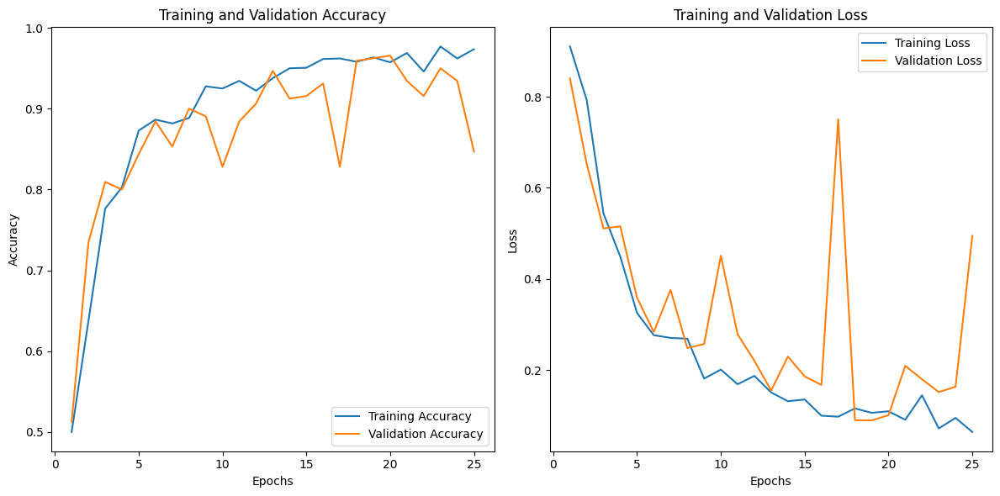

In [37]:
EPOCHS = 25

# Create the plots
plt.figure(figsize=(12, 6))  # Adjust the figure size
plt.subplot(1, 2, 1)
plt.plot(range(1, EPOCHS + 1), acc, label='Training Accuracy')
plt.plot(range(1, EPOCHS + 1), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(1, EPOCHS + 1), loss, label='Training Loss')
plt.plot(range(1, EPOCHS + 1), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()

## **Performing Inference on Sample Images Using a Custom Inference Function**

In [38]:
import numpy as np
import tensorflow as tf

def predict(CNN_model, img):
    # Convert the image to a NumPy array and add an extra batch dimension
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    # Perform inference (prediction) using the model
    predictions = CNN_model.predict(img_array)

    # Get the predicted class label and confidence
    class_names = ["Potato___Early_blight", "Potato___Late_blight", "Potato___healthy"]
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 20ms/step


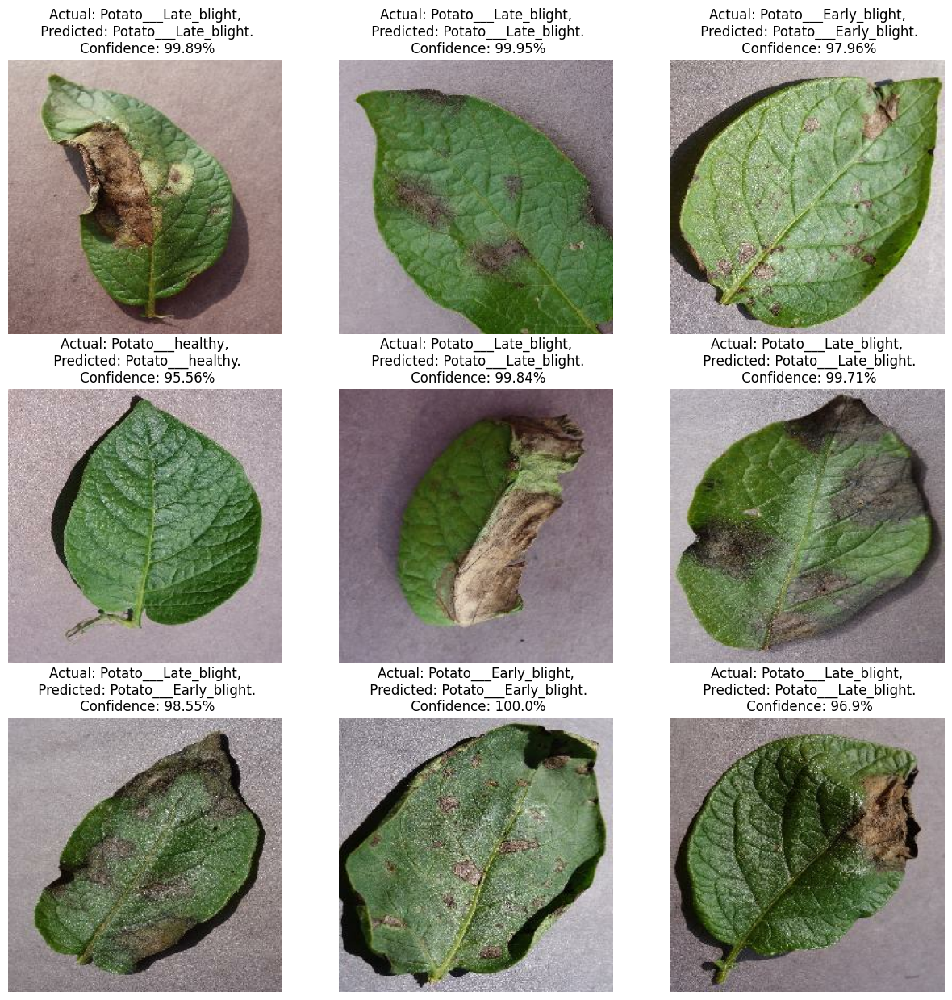

In [39]:
plt.figure(figsize=(15, 15))

for images, labels in test_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(CNN_model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

plt.show()

## **VGG (Visual Geometry Group) Model Architecture**

In [40]:
from tensorflow.keras import models, layers, Input

no_of_classes = 3

# Input layer
inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
resize_and_rescale = layers.Rescaling(1./255)(inputs)

# Convolutional layers (VGG-like)
x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(resize_and_rescale)
x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)

x = layers.Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)

x = layers.Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)

x = layers.Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)

x = layers.Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2))(x)

# Flatten and dense layers
x = layers.Flatten()(x)
x = layers.Dense(4096, activation='relu')(x)
x = layers.Dense(4096, activation='relu')(x)
outputs = layers.Dense(no_of_classes, activation='softmax')(x)

# Create the VGG model
vgg_model = models.Model(inputs=inputs, outputs=outputs)

# Display the model summary
vgg_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 256, 256, 64)      1792      
                                                                 
 conv2d_7 (Conv2D)           (None, 256, 256, 64)      36928     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 128, 128, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 128, 128, 128)     73856     
                                                           

## **Compiling the VGG_model with adam optimizer and accuracy as the metric**

In [45]:
# Compile the VGG model
vgg_model.compile(optimizer='adam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])

## **Training the VGG model using fit() Method**

In [46]:
# Training the VGG model
model_train3 = vgg_model.fit(
    train_dataset,
    batch_size=BATCH_SIZE,
    validation_data=val_dataset,
    verbose=1,
    epochs=25,
)

Epoch 1/25
47/47 [==============================] - 56s 722ms/step - loss: 2.7544 - accuracy: 0.4736 - val_loss: 0.8731 - val_accuracy: 0.4875
Epoch 2/25
47/47 [==============================] - 27s 566ms/step - loss: 0.9138 - accuracy: 0.4426 - val_loss: 0.8789 - val_accuracy: 0.4875
Epoch 3/25
47/47 [==============================] - 27s 574ms/step - loss: 0.9099 - accuracy: 0.4588 - val_loss: 0.8913 - val_accuracy: 0.4563
Epoch 4/25
47/47 [==============================] - 28s 582ms/step - loss: 0.9131 - accuracy: 0.4655 - val_loss: 0.8858 - val_accuracy: 0.4875
Epoch 5/25
47/47 [==============================] - 27s 572ms/step - loss: 0.9094 - accuracy: 0.4500 - val_loss: 0.8744 - val_accuracy: 0.4875
Epoch 6/25
47/47 [==============================] - 27s 578ms/step - loss: 0.9054 - accuracy: 0.4689 - val_loss: 0.8777 - val_accuracy: 0.4563
Epoch 7/25
47/47 [==============================] - 27s 575ms/step - loss: 0.9052 - accuracy: 0.4534 - val_loss: 0.8745 - val_accuracy: 0.4875

## **Evaluating the scores  of the VGG Model on the test dataset**

In [48]:
vgg_model_scores = vgg_model.evaluate(test_dataset)

11/11 [==============================] - 2s 158ms/step - loss: 0.9093 - accuracy: 0.4688


In [49]:
vgg_model_scores

[0.9092977046966553, 0.46875]

In [50]:
model_train3

In [51]:
model_train3.params

{'verbose': 1, 'epochs': 25, 'steps': 47}

In [52]:
model_train3.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [53]:
model_train3.history['loss']

[2.75443172454834,
 0.9138164520263672,
 0.9099207520484924,
 0.9130796790122986,
 0.9093915820121765,
 0.9053906202316284,
 0.9052046537399292,
 0.9070017337799072,
 0.9092774987220764,
 0.9072664976119995,
 0.9043837189674377,
 0.9059693813323975,
 0.9044340252876282,
 0.9060122966766357,
 0.9077457189559937,
 0.9043998718261719,
 0.9059418439865112,
 0.9054245352745056,
 0.9028756618499756,
 0.9033520817756653,
 0.9046263098716736,
 0.905450701713562,
 0.90330570936203,
 0.9046720862388611,
 0.9045829772949219]

In [54]:
model_train3.history['accuracy']

[0.47364863753318787,
 0.4425675570964813,
 0.4587837755680084,
 0.4655405282974243,
 0.44999998807907104,
 0.46891891956329346,
 0.4533783793449402,
 0.4635135233402252,
 0.4790540635585785,
 0.4695945978164673,
 0.45202702283859253,
 0.43581080436706543,
 0.45270270109176636,
 0.4695945978164673,
 0.4466216266155243,
 0.4567567706108093,
 0.47094595432281494,
 0.43648648262023926,
 0.4797297418117523,
 0.47297295928001404,
 0.44999998807907104,
 0.46148648858070374,
 0.47364863753318787,
 0.4405405521392822,
 0.45472973585128784]

In [55]:
# Extract training and validation accuracy and loss from the history object
acc = model_train3.history['accuracy']
val_acc = model_train3.history['val_accuracy']
loss = model_train3.history['loss']
val_loss = model_train3.history['val_loss']

# Print the extracted metrics
print("Training Accuracy:", acc)
print("Validation Accuracy:", val_acc)
print("Training Loss:", loss)
print("Validation Loss:", val_loss)

Training Accuracy: [0.47364863753318787, 0.4425675570964813, 0.4587837755680084, 0.4655405282974243, 0.44999998807907104, 0.46891891956329346, 0.4533783793449402, 0.4635135233402252, 0.4790540635585785, 0.4695945978164673, 0.45202702283859253, 0.43581080436706543, 0.45270270109176636, 0.4695945978164673, 0.4466216266155243, 0.4567567706108093, 0.47094595432281494, 0.43648648262023926, 0.4797297418117523, 0.47297295928001404, 0.44999998807907104, 0.46148648858070374, 0.47364863753318787, 0.4405405521392822, 0.45472973585128784]
Validation Accuracy: [0.48750001192092896, 0.48750001192092896, 0.45625001192092896, 0.48750001192092896, 0.48750001192092896, 0.45625001192092896, 0.48750001192092896, 0.45625001192092896, 0.48750001192092896, 0.45625001192092896, 0.48750001192092896, 0.45625001192092896, 0.45625001192092896, 0.45625001192092896, 0.48750001192092896, 0.45625001192092896, 0.45625001192092896, 0.45625001192092896, 0.48750001192092896, 0.45625001192092896, 0.45625001192092896, 0.48

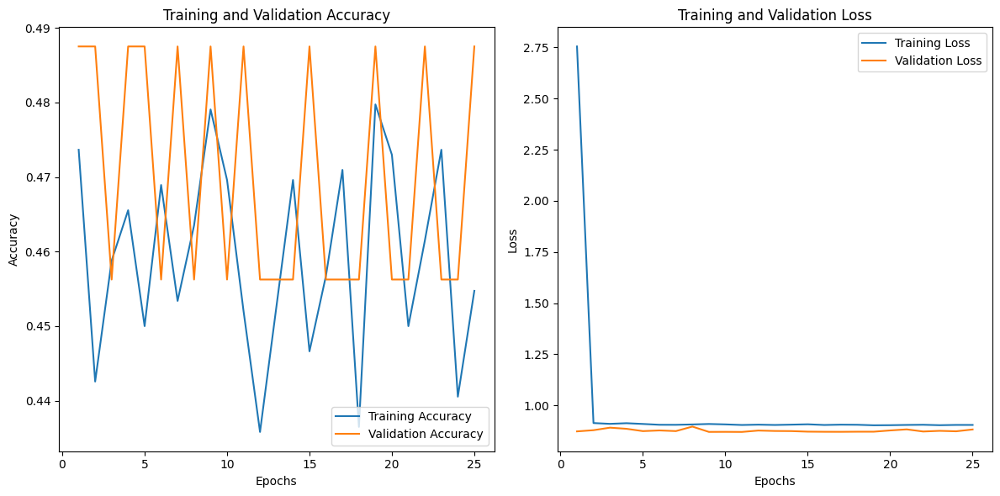

In [56]:
EPOCHS = 25

# Create the plots
plt.figure(figsize=(12, 6))  # Adjust the figure size
plt.subplot(1, 2, 1)
plt.plot(range(1, EPOCHS + 1), acc, label='Training Accuracy')
plt.plot(range(1, EPOCHS + 1), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(1, EPOCHS + 1), loss, label='Training Loss')
plt.plot(range(1, EPOCHS + 1), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()

## **Performing Inference on Sample Images Using a Custom Inference Function for VGG Model**

In [57]:
import numpy as np
import tensorflow as tf

def predict(model, img):
    # Convert the image to a NumPy array and add an extra batch dimension
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    # Perform inference (prediction) using the model
    predictions = model.predict(img_array)

    # Get the predicted class label and confidence
    class_names = ["Potato___Early_blight", "Potato___Late_blight", "Potato___healthy"]
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 19ms/step


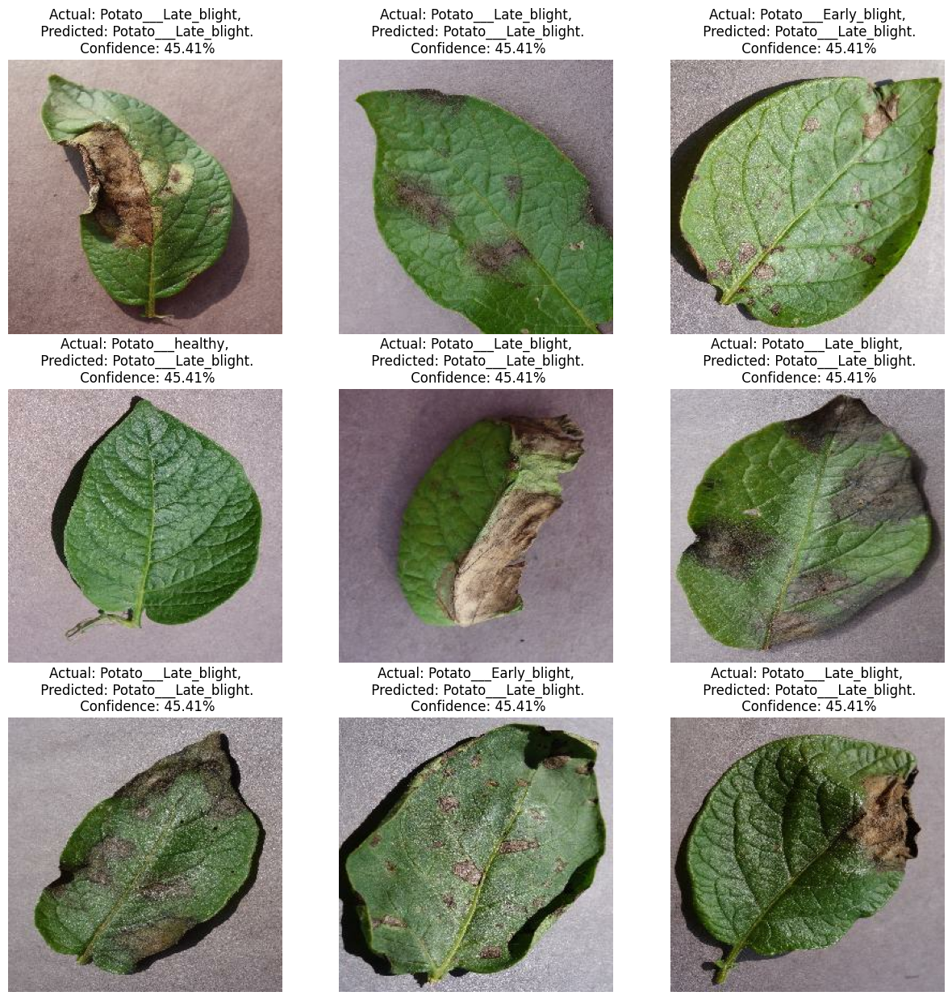

In [59]:
plt.figure(figsize=(15, 15))

for images, labels in test_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(vgg_model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

plt.show()

## **RESNET Model Architecture**

In [60]:
from tensorflow.keras import models, layers, Input

def residual_block(input_tensor, filters, kernel_size=3, stride=1):
    x = layers.Conv2D(filters, kernel_size, strides=stride, padding='same', activation='relu')(input_tensor)
    x = layers.Conv2D(filters, kernel_size, strides=1, padding='same')(x)

    # Adjust the shortcut path to match the shape of `x`
    shortcut = input_tensor
    if stride != 1 or input_tensor.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, 1, strides=stride, padding='same')(input_tensor)

    x = layers.add([x, shortcut])
    x = layers.Activation('relu')(x)
    return x

no_of_classes = 3
IMAGE_SIZE = 256
CHANNELS = 3      # Typically 3 for RGB images

# Input layer
inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
resize_and_rescale = layers.Rescaling(1./255)(inputs)

# Initial Convolutional layer
x = layers.Conv2D(64, 7, strides=2, padding='same', activation='relu')(resize_and_rescale)
x = layers.MaxPooling2D(3, strides=2, padding='same')(x)

# Residual blocks
x = residual_block(x, 64)
x = residual_block(x, 128, stride=2)
x = residual_block(x, 256, stride=2)
x = residual_block(x, 512, stride=2)

# Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

# Dense layers
x = layers.Dense(64, activation='relu')(x)
outputs = layers.Dense(no_of_classes, activation='softmax')(x)

# Create the model
resnet_model = models.Model(inputs=inputs, outputs=outputs)

# Display the model summary
resnet_model.summary()


Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 256, 256, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv2d_19 (Conv2D)          (None, 128, 128, 64)         9472      ['rescaling_3[0][0]']         
                                                                                                  
 max_pooling2d_11 (MaxPooli  (None, 64, 64, 64)           0         ['conv2d_19[0][0]']           
 ng2D)                                                                                      

## **Compiling the resnet_model with adam optimizer and accuracy as the metric**

In [61]:
# Compile the model
resnet_model.compile(optimizer='adam',
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy'])

## **Training the resnet_model using fit() Method**

In [62]:
# Train the model
model_train4 = resnet_model.fit(
    train_dataset,
    batch_size=BATCH_SIZE,
    validation_data=val_dataset,
    verbose=1,
    epochs=25,
)

Epoch 1/25
47/47 [==============================] - 22s 297ms/step - loss: 0.9680 - accuracy: 0.4615 - val_loss: 0.8797 - val_accuracy: 0.4563
Epoch 2/25
47/47 [==============================] - 13s 268ms/step - loss: 0.9216 - accuracy: 0.4500 - val_loss: 0.8658 - val_accuracy: 0.4563
Epoch 3/25
47/47 [==============================] - 13s 272ms/step - loss: 0.8417 - accuracy: 0.6311 - val_loss: 0.6178 - val_accuracy: 0.7250
Epoch 4/25
47/47 [==============================] - 13s 274ms/step - loss: 0.6674 - accuracy: 0.7845 - val_loss: 0.5911 - val_accuracy: 0.7844
Epoch 5/25
47/47 [==============================] - 13s 271ms/step - loss: 0.8070 - accuracy: 0.6264 - val_loss: 0.7026 - val_accuracy: 0.7719
Epoch 6/25
47/47 [==============================] - 13s 273ms/step - loss: 0.5876 - accuracy: 0.8068 - val_loss: 0.6031 - val_accuracy: 0.7406
Epoch 7/25
47/47 [==============================] - 13s 272ms/step - loss: 0.4988 - accuracy: 0.8203 - val_loss: 0.5618 - val_accuracy: 0.7812

## **Evaluating the scores of the resnet_model on the test dataset**

In [63]:
resnet_model_scores = resnet_model.evaluate(test_dataset)

11/11 [==============================] - 0s 27ms/step - loss: 0.3020 - accuracy: 0.8750


In [64]:
resnet_model_scores

[0.3019779622554779, 0.875]

In [65]:
model_train4

In [66]:
model_train4.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [67]:
model_train4.history['loss']

[0.9680044651031494,
 0.9216133952140808,
 0.8416813015937805,
 0.6673584580421448,
 0.8070318102836609,
 0.5876333713531494,
 0.49877023696899414,
 0.5052534937858582,
 0.4826986491680145,
 0.45123860239982605,
 0.4562155604362488,
 0.4578927457332611,
 0.4464029371738434,
 0.4215400218963623,
 0.45251208543777466,
 0.42134296894073486,
 0.3942640423774719,
 0.392954558134079,
 0.47982552647590637,
 0.4099203050136566,
 0.36977630853652954,
 0.38933882117271423,
 0.3493170738220215,
 0.37896838784217834,
 0.3122114837169647]

In [68]:
model_train4.history['accuracy']

[0.46148648858070374,
 0.44999998807907104,
 0.6310811042785645,
 0.7844594717025757,
 0.6263513565063477,
 0.8067567348480225,
 0.820270299911499,
 0.8236486315727234,
 0.8310810923576355,
 0.8364864587783813,
 0.8344594836235046,
 0.833108127117157,
 0.8324324488639832,
 0.8479729890823364,
 0.8337838053703308,
 0.8445945978164673,
 0.8560810685157776,
 0.8560810685157776,
 0.8270270228385925,
 0.8527026772499084,
 0.8608108162879944,
 0.8547297120094299,
 0.8628378510475159,
 0.8506757020950317,
 0.875]

In [69]:
# Extract training and validation accuracy and loss from the history object
acc = model_train4.history['accuracy']
val_acc = model_train4.history['val_accuracy']
loss = model_train4.history['loss']
val_loss = model_train4.history['val_loss']

# Print the extracted metrics
print("Training Accuracy:", acc)
print("Validation Accuracy:", val_acc)
print("Training Loss:", loss)
print("Validation Loss:", val_loss)

Training Accuracy: [0.46148648858070374, 0.44999998807907104, 0.6310811042785645, 0.7844594717025757, 0.6263513565063477, 0.8067567348480225, 0.820270299911499, 0.8236486315727234, 0.8310810923576355, 0.8364864587783813, 0.8344594836235046, 0.833108127117157, 0.8324324488639832, 0.8479729890823364, 0.8337838053703308, 0.8445945978164673, 0.8560810685157776, 0.8560810685157776, 0.8270270228385925, 0.8527026772499084, 0.8608108162879944, 0.8547297120094299, 0.8628378510475159, 0.8506757020950317, 0.875]
Validation Accuracy: [0.45625001192092896, 0.45625001192092896, 0.7250000238418579, 0.784375011920929, 0.7718750238418579, 0.7406250238418579, 0.78125, 0.831250011920929, 0.800000011920929, 0.846875011920929, 0.7875000238418579, 0.8531249761581421, 0.8218749761581421, 0.824999988079071, 0.8656250238418579, 0.831250011920929, 0.8531249761581421, 0.8656250238418579, 0.831250011920929, 0.8687499761581421, 0.84375, 0.8500000238418579, 0.859375, 0.862500011920929, 0.840624988079071]
Training L

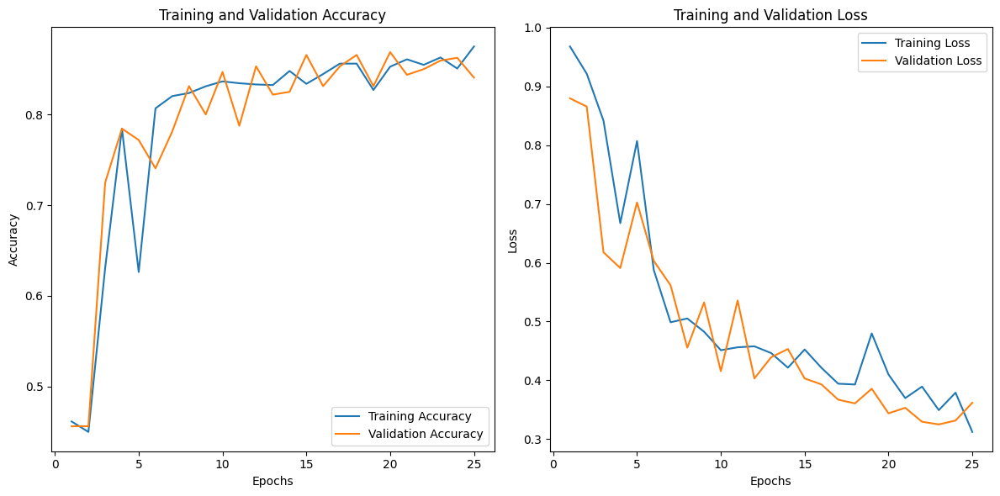

In [70]:
EPOCHS = 25

# Create the plots
plt.figure(figsize=(12, 6))  # Adjust the figure size
plt.subplot(1, 2, 1)
plt.plot(range(1, EPOCHS + 1), acc, label='Training Accuracy')
plt.plot(range(1, EPOCHS + 1), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(1, EPOCHS + 1), loss, label='Training Loss')
plt.plot(range(1, EPOCHS + 1), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()

## **Performing Inference on Sample Images Using a Custom Inference Function for Resnet Model**

In [71]:
import numpy as np
import tensorflow as tf

def predict(resnet_model, img):
    # Convert the image to a NumPy array and add an extra batch dimension
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    # Perform inference (prediction) using the model
    predictions = resnet_model.predict(img_array)

    # Get the predicted class label and confidence
    class_names = ["Potato___Early_blight", "Potato___Late_blight", "Potato___healthy"]
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 20ms/step


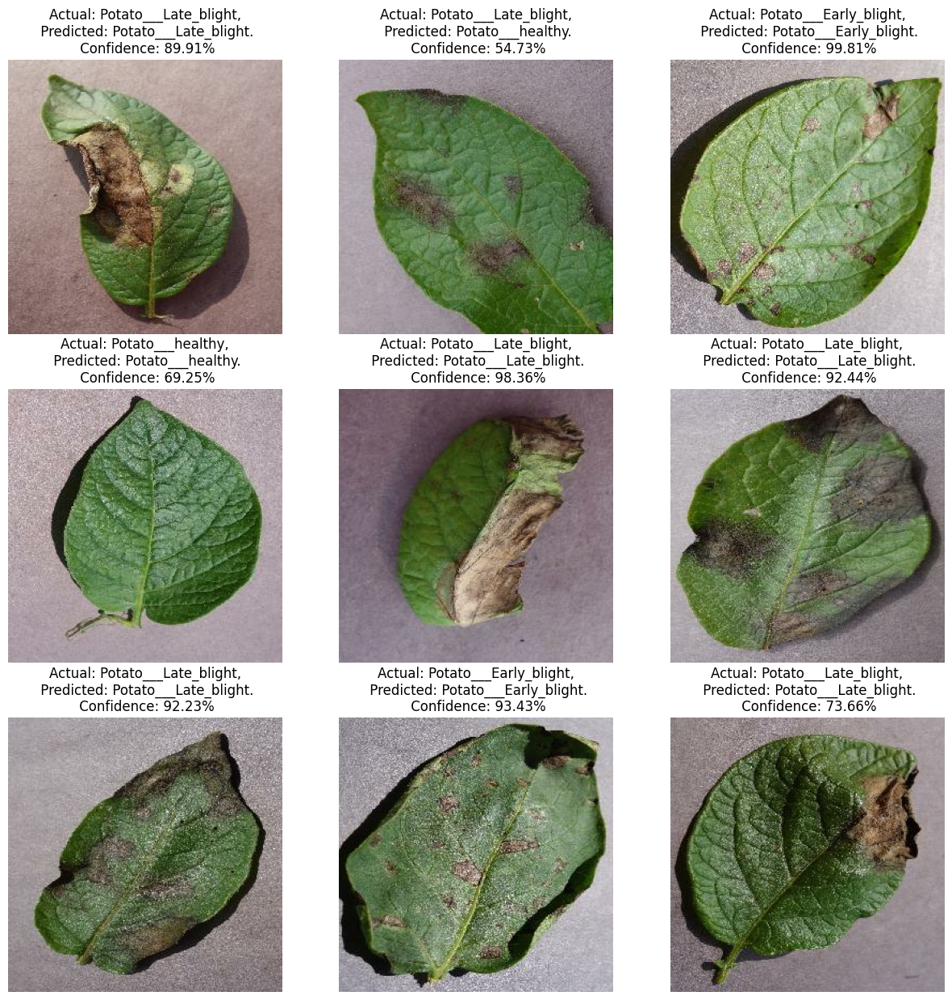

In [72]:
plt.figure(figsize=(15, 15))

for images, labels in test_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(resnet_model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

plt.show()

## **Saving the models**

In [73]:
CNN_model.save('CNN_Model')
vgg_model.save('VGG_Model')
resnet_model.save('RESNET_Model')

## **References**

[1] https://github.com/codebasics/potato-disease-classification/blob/main/training/potato-disease-classification-model.ipynb

[2] https://www.mdpi.com/2073-4395/12/10/2395#:~:text=With%20the%20advent%20of%20machine,original%20characteristics%20of%20an%20image.